- #### Overview:
IBM-HR-Emplyee dataset having features about Employee age, education, job satifaction, job involvement and more. The target to predict is the employee attrition. 



- #### Problem Statement:
Predicting employee attrition using classification mechine learning models.



- #### Data:
Data was found in Kaggle:
https://www.kaggle.com/pavansubhasht/ibm-hr-analytics-attrition-dataset

In [386]:
#Data Analysis libraries
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use("template")
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
from pandas_profiling import ProfileReport
from mlxtend.plotting import plot_confusion_matrix

#imbalance dataset libraries
from imblearn.over_sampling import SMOTE

#Machine learning libraries
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, fbeta_score, confusion_matrix,precision_recall_curve
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
import xgboost as xgb
import sklearn.metrics as metrics

In [387]:
import warnings
warnings.filterwarnings('ignore')

### Helper functions

In [388]:
def drop_constants_and_uniques(df):
        for column in df.columns:
            if(df[column].nunique()==1) | (df[column].nunique()==len(df)) :
                df.drop(column,axis=1,inplace=True)
        return df
    
def print_scores(actuals,preds, bta=2):
    print("The accuarcy score is",round(accuracy_score(actuals, preds),4)*100,'%')
    print("The precision score is",round(precision_score(actuals, preds),4)*100,'%')
    print("The recall score is",round(recall_score(actuals, preds),4)*100,'%')
    print("The f1 score is",round(f1_score(actuals, preds),4)*100,'%')
    f_bta = fbeta_score(actuals, preds, beta=bta)
    print("The fbeta of", bta,"score is", f_bta)
    
    
def show_confusion_matrix(actuals,preds):
    conf_matrix = confusion_matrix(actuals,preds)
    fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(4, 4), cmap=plt.cm.PuBu)
    plt.xlabel('Predictions', fontsize=18)
    plt.ylabel('Actuals', fontsize=18)
    plt.title('Confusion Matrix', fontsize=18)
    plt.show()
    
    
Experiments_log={}    
def log_experiment(ExpNo, Model, Precision, Recall, F1, Comment):
    Experiments_log[ExpNo]=[Model, Precision, Recall, F1, Comment]

### Reading Data

In [389]:
df=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
df.head(3)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0


In [390]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

#### How many records are in the data?

In [391]:
len(df)

1470

#### Since the target is the column 'Attrition', lets see its distrubution,is it balanced?

In [392]:
df['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

<AxesSubplot:>

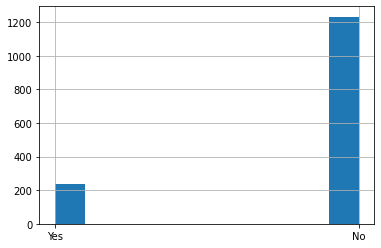

In [393]:
df['Attrition'].hist()

### EDA using pandas profiling

In [326]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [394]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### columns to drop: Constants and Uniques

In [440]:
df=drop_constants_and_uniques(df)

In [441]:
len(df.columns)

31

#### Is there any row with more than 75% of it equals zero?

In [442]:
sum((df == 0).sum(axis=1)/len(df.columns)>=0.75)

0

#### Feature Engineering: Labeling target "Attrition": 'Yes' --> 1 and 'No' --> 0 using LabelEncoder

In [443]:
le = LabelEncoder()
le.fit(df.Attrition)
df["Attrition"] = le.transform(df.Attrition)

#### Split the data into training, testing and validation

In [444]:
train, test = train_test_split(df, test_size = 0.2, random_state = 33,stratify=df['Attrition'])
train, val = train_test_split(train, test_size = 0.2, random_state = 33)

In [445]:
print('Percentage of Yes in Train dataset:' ,round((sum(train['Attrition']==1)/len (train['Attrition']))*100))
print('Percentage of Yes in Test dataset:' ,round((sum(test['Attrition']==1)/len (test['Attrition']))*100))
print('Percentage of Yes in Validation dataset:' ,round((sum(val['Attrition']==1)/len (val['Attrition']))*100))

Percentage of Yes in Train dataset: 16
Percentage of Yes in Test dataset: 16
Percentage of Yes in Validation dataset: 17


#### From above results we can say that data is almost stratified in all splits.

### Baseline Model : Logistic Regression

- Note: we will consider in predictors of baseline model only the numerical features

In [446]:
train_no_categorical=train.drop(train.select_dtypes(exclude=np.int64).columns, axis=1)
val_no_categorical=val.drop(val.select_dtypes(exclude=np.int64).columns, axis=1)

In [447]:
X_train=train_no_categorical.drop("Attrition", axis=1)
y_train=train_no_categorical["Attrition"]
X_val=val_no_categorical.drop("Attrition", axis=1)
y_val=val_no_categorical["Attrition"]

In [448]:
LR = LogisticRegression(max_iter=200, random_state =10)
LR.fit(X_train,y_train)
    
print("Train Scores:")
preds = LR.predict(X_train)
print_scores(y_train,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
preds_val = LR.predict(X_val)
print_scores(val_no_categorical.Attrition,preds_val)

Train Scores:
The accuarcy score is 84.36 %
The precision score is 83.33 %
The recall score is 3.3099999999999996 %
The f1 score is 6.370000000000001 %
The fbeta of 2 score is 0.04098360655737705

-----------------------------------------------

Validation scores:
The accuarcy score is 83.47 %
The precision score is 50.0 %
The recall score is 2.56 %
The f1 score is 4.88 %
The fbeta of 2 score is 0.03164556962025316


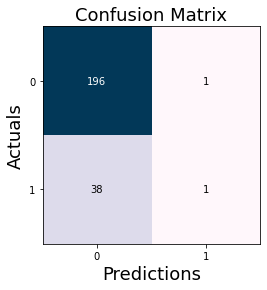

In [449]:
show_confusion_matrix(val.Attrition, preds_val)

### Experiment 1: Feature Engineering (Adding categorical variables)

In [450]:
train_dummies=pd.get_dummies(train)
val_dummies=pd.get_dummies(val)

In [451]:
X_train_dummies=train_dummies.drop('Attrition',axis=1)
y_train_dummies=train_dummies['Attrition']

In [452]:
X_val_dummies=val_dummies.drop('Attrition',axis=1)
y_val_dummies=val_dummies['Attrition']

In [453]:
LR = LogisticRegression(max_iter=200, random_state =10)
LR.fit(X_train_dummies,y_train_dummies)
    
print("Train Scores:")
preds = LR.predict(X_train_dummies)
print_scores(y_train_dummies,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
preds_val = LR.predict(X_val_dummies)
print_scores(y_val_dummies,preds_val)

Train Scores:
The accuarcy score is 83.83 %
The precision score is 44.440000000000005 %
The recall score is 2.65 %
The f1 score is 5.0 %
The fbeta of 2 score is 0.032626427406199025

-----------------------------------------------

Validation scores:
The accuarcy score is 83.47 %
The precision score is 50.0 %
The recall score is 2.56 %
The f1 score is 4.88 %
The fbeta of 2 score is 0.03164556962025316


In [454]:
log_experiment(1, LR, precision_score(y_val_dummies, preds_val), 
               recall_score(y_val_dummies, preds_val), 
               f1_score(y_val_dummies, preds_val), 'Underfitting')

### Experiment 2: Standard Scalar and Transformation

In [455]:
std_scale = StandardScaler()
X_train_scaled = std_scale.fit_transform(X_train_dummies)
LR.fit(X_train_scaled,y_train_dummies)
    
print("Train Scores:")
preds = LR.predict(X_train_scaled)
print_scores(y_train_dummies,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
X_val_dummies_transformed=std_scale.fit_transform(X_val_dummies)
preds_val = LR.predict(X_val_dummies_transformed)
print_scores(y_val_dummies,preds_val)

Train Scores:
The accuarcy score is 89.36 %
The precision score is 77.42 %
The recall score is 47.68 %
The f1 score is 59.019999999999996 %
The fbeta of 2 score is 0.5164992826398852

-----------------------------------------------

Validation scores:
The accuarcy score is 86.44 %
The precision score is 62.96000000000001 %
The recall score is 43.59 %
The f1 score is 51.519999999999996 %
The fbeta of 2 score is 0.46448087431693996


In [456]:
log_experiment(2, LR, precision_score(y_val_dummies, preds_val), 
               recall_score(y_val_dummies, preds_val), 
               f1_score(y_val_dummies, preds_val), 'StandardScaled+Underfitting')

### Experiment 3: Decision Tree

In [457]:
DT = DecisionTreeClassifier(max_depth=5,random_state=33)
DT.fit(X_train_dummies,y_train_dummies)


print("Train Scores:")
preds = DT.predict(X_train_dummies)
print_scores(y_train_dummies,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
preds_val_DT = DT.predict(X_val_dummies)
print_scores(y_val_dummies,preds_val_DT)

Train Scores:
The accuarcy score is 90.96 %
The precision score is 80.0 %
The recall score is 58.28 %
The f1 score is 67.43 %
The fbeta of 2 score is 0.6162464985994397

-----------------------------------------------

Validation scores:
The accuarcy score is 85.59 %
The precision score is 63.160000000000004 %
The recall score is 30.769999999999996 %
The f1 score is 41.38 %
The fbeta of 2 score is 0.3428571428571429


In [458]:
log_experiment(3, DT, precision_score(y_val_dummies, preds_val_DT), 
               recall_score(y_val_dummies, preds_val_DT), 
               f1_score(y_val_dummies, preds_val_DT), 'Overfitting')

#### Note: Decsision Tree is Overfitting as seen above

### Experiment 4: Random Forest

In [459]:
RF = RandomForestClassifier(n_estimators=100,random_state=33)
RF.fit(X_train_dummies,y_train_dummies)


print("Train Scores:")
preds = RF.predict(X_train_dummies)
print_scores(y_train_dummies,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
preds_val_RF = RF.predict(X_val_dummies)
print_scores(y_val_dummies,preds_val_RF)

Train Scores:
The accuarcy score is 100.0 %
The precision score is 100.0 %
The recall score is 100.0 %
The f1 score is 100.0 %
The fbeta of 2 score is 1.0

-----------------------------------------------

Validation scores:
The accuarcy score is 86.02 %
The precision score is 87.5 %
The recall score is 17.95 %
The f1 score is 29.79 %
The fbeta of 2 score is 0.21341463414634146


In [460]:
log_experiment(4, RF, precision_score(y_val_dummies, preds_val_RF), 
               recall_score(y_val_dummies, preds_val_RF), 
               f1_score(y_val_dummies, preds_val_RF), 'Extreme Overfitting')

#### Note: Decsision Tree is Overfitting Extremely as seen above

### Experiment 5: Oversampling the training dataset using SMOTE, Logistic Regression

In [461]:
smote = imblearn.over_sampling.SMOTE(random_state = 42)
X_train_res, y_train_res = smote.fit_resample(X_train_dummies,y_train_dummies)

In [462]:
LR=LogisticRegression()
LR.fit(X_train_res,y_train_res)
    
print("Train Scores:")
preds = LR.predict(X_train_res)
print_scores(y_train_res,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
preds_val = LR.predict(X_val_dummies)
print_scores(y_val_dummies,preds_val)

Train Scores:
The accuarcy score is 70.15 %
The precision score is 68.66 %
The recall score is 74.14 %
The f1 score is 71.3 %
The fbeta of 2 score is 0.7297904191616766

-----------------------------------------------

Validation scores:
The accuarcy score is 66.95 %
The precision score is 25.319999999999997 %
The recall score is 51.28 %
The f1 score is 33.900000000000006 %
The fbeta of 2 score is 0.42553191489361697


In [463]:
log_experiment(5, LR, precision_score(y_val_dummies, preds_val), 
               recall_score(y_val_dummies,preds_val), 
               f1_score(y_val_dummies, preds_val), 'SMOT')

### Feature Analysis and Engineering

#### - Feature Importance. 
#### Note: Data used here is whole dataset before splitting

[0.03591319 0.02725327 0.03039492 0.02313418 0.03197888 0.02704338
 0.02765807 0.0296191  0.02943404 0.03415529 0.02719002 0.03076663
 0.02565859 0.01289834 0.03060112 0.02624069 0.03394651 0.02510278
 0.02948286 0.02922491 0.02831187 0.02440398 0.0277306  0.00696777
 0.01889287 0.01208506 0.00313338 0.01074069 0.00989526 0.00328994
 0.01347887 0.00992318 0.01606845 0.00585741 0.01402843 0.0157553
 0.01580133 0.00610139 0.00367895 0.01627342 0.00404857 0.00711717
 0.00232809 0.01042293 0.01049609 0.01545989 0.01006908 0.01420689
 0.02535574 0.03738369 0.03299695]


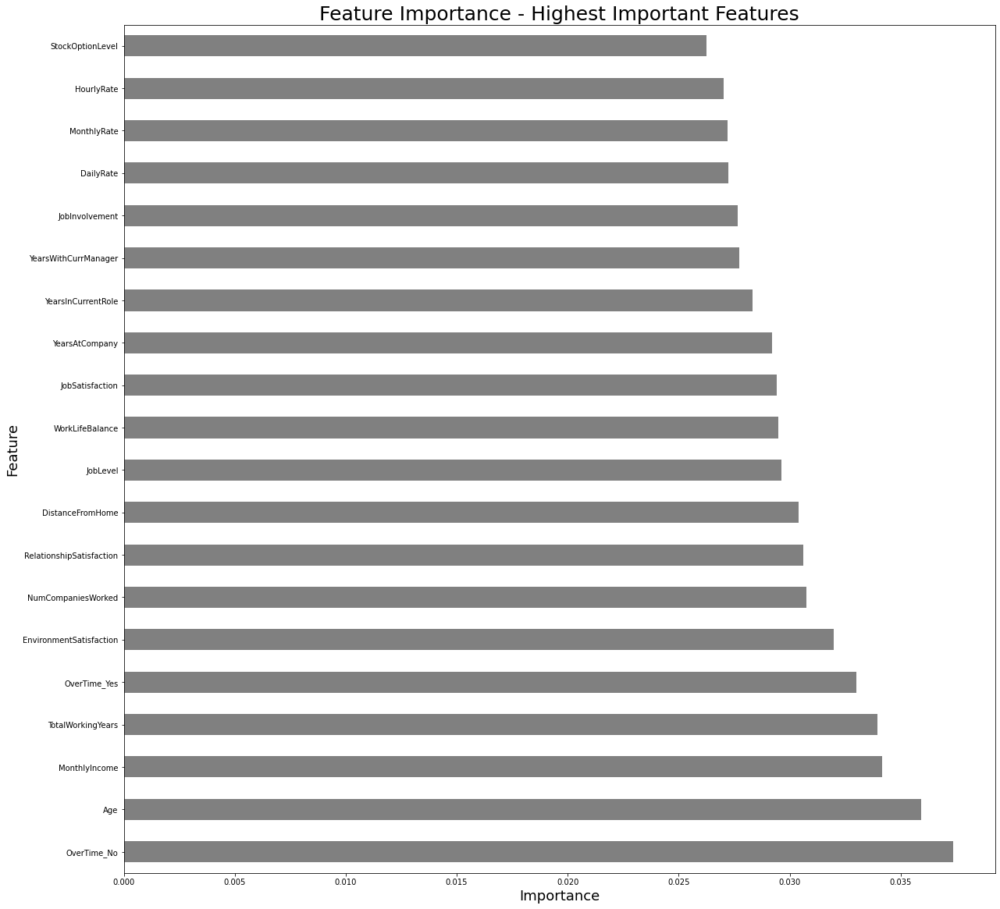

In [464]:
model = ExtraTreesClassifier()
df_dummies=pd.get_dummies(df)
X=df_dummies.drop("Attrition",axis=1)
y=df_dummies["Attrition"]
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh',figsize=(20,20),color='grey')
plt.title('Feature Importance - Highest Important Features',fontsize=25)
plt.xlabel("Importance",fontsize=18)
plt.ylabel("Feature",fontsize=18)
plt.show()

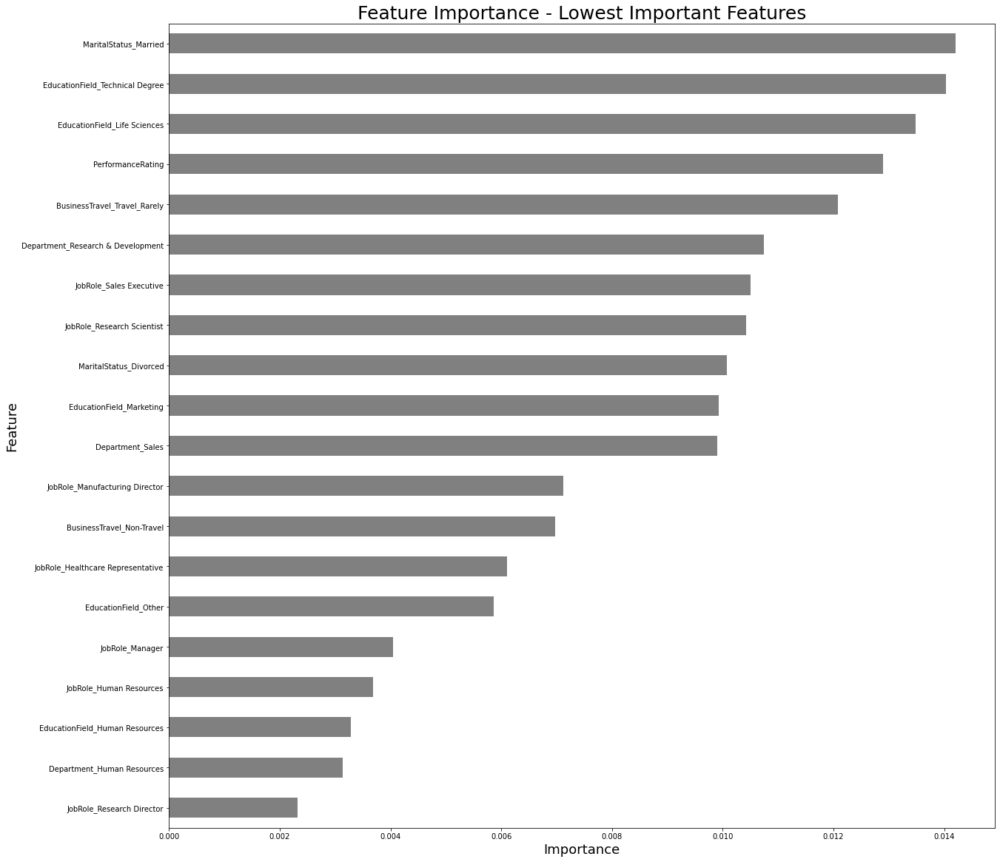

In [465]:
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nsmallest(20).plot(kind='barh',figsize=(20,20),color='grey')
plt.title('Feature Importance - Lowest Important Features',fontsize=25)
plt.xlabel("Importance",fontsize=18)
plt.ylabel("Feature",fontsize=18)
plt.show()

#### Quick Check to see if there is really no relation between JobRole and Attrition

In [466]:
JobRoles_EDA=df[['JobRole','Attrition']]
JobRoles_EDA.JobRole.value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

In [467]:
JobRoles_EDA_grouped=JobRoles_EDA.groupby(['JobRole']).sum('Attrition')
JobRoles_EDA_grouped

,Attrition
JobRole,
Healthcare Representative,9
Human Resources,12
Laboratory Technician,62
Manager,5
Manufacturing Director,10
Research Director,2
Research Scientist,47
Sales Executive,57
Sales Representative,33


#### apparently there is a slight relation from quick check above, so it won't be removed

### Experiment 6: Removing Low important Feature ('Department')

In [468]:
JobRoles_Department=df[['Department']]
JobRoles_Department.Department.value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

In [469]:
X_train_exp_7=X_train_dummies.drop(['Department_Human Resources','Department_Sales','Department_Research & Development'],axis=1)
X_val_exp_7=X_val_dummies.drop(['Department_Human Resources','Department_Sales','Department_Research & Development'],axis=1)

In [470]:
LR=LogisticRegression()
X_train_scaled = std_scale.fit_transform(X_train_exp_7)
LR.fit(X_train_scaled,y_train_dummies)
    
print("Train Scores:")
preds = LR.predict(X_train_scaled)
print_scores(y_train_dummies,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
X_val_dummies_transformed=std_scale.fit_transform(X_val_exp_7)
preds_val = LR.predict(X_val_dummies_transformed)
print_scores(y_val_dummies,preds_val)

Train Scores:
The accuarcy score is 89.36 %
The precision score is 77.42 %
The recall score is 47.68 %
The f1 score is 59.019999999999996 %
The fbeta of 2 score is 0.5164992826398852

-----------------------------------------------

Validation scores:
The accuarcy score is 86.44 %
The precision score is 62.96000000000001 %
The recall score is 43.59 %
The f1 score is 51.519999999999996 %
The fbeta of 2 score is 0.46448087431693996


In [471]:
log_experiment(6, LR, precision_score(y_val_dummies, preds_val), 
               recall_score(y_val_dummies,preds_val), 
               f1_score(y_val_dummies, preds_val), 'Removing Low important feature(Department)')

Above results indicate no difference

### - More Feature Engineering.
#### Trying to combine features

In [472]:
df_numeric=df.drop(train.select_dtypes(exclude=np.int64).columns, axis=1)
df_numeric.corr()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,0.509604,-0.004892,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,-0.103369,-0.006846,-0.130016,-0.169105,-0.103481,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.002966,0.030571,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,0.005303,-0.003669,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,0.101589,-0.011296,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,0.001212,-0.006784,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,-0.006846,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.027853,-0.071335,...,-0.002172,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,-0.130016,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.012630,-0.021476,...,-0.029071,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,-0.169105,0.002966,0.005303,0.101589,0.001212,-0.027853,-0.012630,1.000000,-0.001944,...,-0.021222,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281
JobSatisfaction,-0.004892,-0.103481,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,...,0.002297,-0.012454,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656


Possible Feature:

- Job_Comfort=EnvironmentSatisfaction * JobInvolvement * WorkLifeBalance

### Experiment 7, adding combination of features

In [473]:
X_train_dummies['Job_Comfort']=X_train_dummies['EnvironmentSatisfaction']*X_train_dummies['JobInvolvement']*X_train_dummies['WorkLifeBalance']
X_val_dummies['Job_Comfort']=X_val_dummies['EnvironmentSatisfaction']*X_val_dummies['JobInvolvement']*X_val_dummies['WorkLifeBalance']
LR=LogisticRegression()
X_train_scaled = std_scale.fit_transform(X_train_dummies)
LR.fit(X_train_scaled,y_train_dummies)
    
print("Train Scores:")
preds = LR.predict(X_train_scaled)
print_scores(y_train_dummies,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
X_val_dummies_transformed=std_scale.fit_transform(X_val_dummies)
preds_val_LR = LR.predict(X_val_dummies_transformed)
print_scores(y_val_dummies,preds_val_LR)

Train Scores:
The accuarcy score is 89.47 %
The precision score is 78.25999999999999 %
The recall score is 47.68 %
The f1 score is 59.260000000000005 %
The fbeta of 2 score is 0.5172413793103448

-----------------------------------------------

Validation scores:
The accuarcy score is 86.02 %
The precision score is 60.709999999999994 %
The recall score is 43.59 %
The f1 score is 50.74999999999999 %
The fbeta of 2 score is 0.4619565217391305


In [474]:
log_experiment(7, LR, precision_score(y_val_dummies, preds_val_LR), 
               recall_score(y_val_dummies,preds_val_LR), 
               f1_score(y_val_dummies, preds_val_LR), 'Job_Comfort=EnvironmentSatisfaction * JobInvolvement * WorkLifeBalance')

### Experiment 8, XGBoost Model

In [475]:
model = xgb.XGBClassifier(eval_metric='mlogloss',
                          learning_rate=1.1095,n_estimators=389)


model.fit(X_train_dummies,y_train_dummies)

print("Train Scores:")
preds = model.predict(X_train_dummies)
print_scores(y_train_dummies,preds)

print("\n-----------------------------------------------")
print("\nValidation scores:")
preds_val_XGBoost = model.predict(X_val_dummies)
print_scores(y_val_dummies,preds_val_XGBoost)

Train Scores:
The accuarcy score is 100.0 %
The precision score is 100.0 %
The recall score is 100.0 %
The f1 score is 100.0 %
The fbeta of 2 score is 1.0

-----------------------------------------------

Validation scores:
The accuarcy score is 89.41 %
The precision score is 85.0 %
The recall score is 43.59 %
The f1 score is 57.63 %
The fbeta of 2 score is 0.4829545454545455


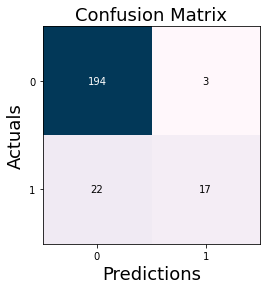

In [476]:
show_confusion_matrix(y_val_dummies, preds_val_XGBoost)

#### Default threshold for predicting label 1 (Attrition) is: 0.5, so lets try to see the effect of changing threshhold on recall and precision using precision_recall_curve 

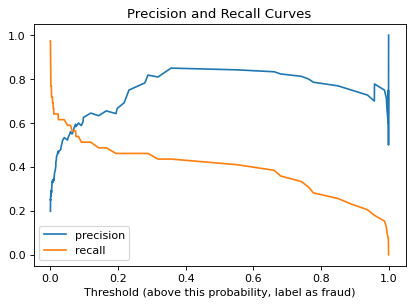

In [477]:
precision_curve, recall_curve, threshold_curve = precision_recall_curve(y_val_dummies, model.predict_proba(X_val_dummies)[:,1] )

plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
plt.xlabel('Threshold (above this probability, label as fraud)');
plt.title('Precision and Recall Curves');

#### From above figure, it can be seen that best threshold is where recall and precision intersect which is around around 0.06

In [478]:
preds_val_XGBoost = (model.predict_proba(X_val_dummies)[:, 1] > 0.06)
f1_score(y_val_dummies, preds_val_XGBoost)

0.575

In [479]:
log_experiment(8, model, precision_score(y_val_dummies, preds_val_XGBoost), 
               recall_score(y_val_dummies,preds_val_XGBoost), 
               f1_score(y_val_dummies, preds_val_XGBoost), '')

## Evaluation

In [480]:
# XGBoost
fpr, tpr, threshold = metrics.roc_curve(y_val_dummies, preds_val_XGBoost)
roc_auc = metrics.auc(fpr, tpr)

#RandomForest
fpr_RF, tpr_RF, threshold_RF = metrics.roc_curve(y_val_dummies,preds_val_RF)
roc_auc_RF = metrics.auc(fpr_RF, tpr_RF)

#DecisionTree
fpr_DT, tpr_DT, threshold_DT = metrics.roc_curve(y_val_dummies,preds_val_DT)
roc_auc_DT = metrics.auc(fpr_DT, tpr_DT)

#LogisticRegression
fpr_LR, tpr_LR, threshold_LR = metrics.roc_curve(y_val_dummies,preds_val_LR)
roc_auc_LR = metrics.auc(fpr_LR, tpr_LR)

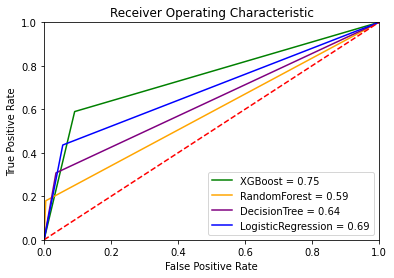

In [481]:
plt.title('Receiver Operating Characteristic')

plt.plot(fpr, tpr, 'g', label = 'XGBoost = %0.2f' % roc_auc)
plt.plot(fpr_RF, tpr_RF, 'orange', label = 'RandomForest = %0.2f' % roc_auc_RF)
plt.plot(fpr_DT, tpr_DT, 'purple', label = 'DecisionTree = %0.2f' % roc_auc_DT)
plt.plot(fpr_LR, tpr_LR, 'b', label = 'LogisticRegression = %0.2f' % roc_auc_LR)

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Datframe having all experiments data

In [482]:
Experiment_log_df=pd.DataFrame(Experiments_log).T
Experiment_log_df.columns=['Model','Precision','Recall','F1','Comment']

In [483]:
Experiment_log_df

,Model,Precision,Recall,F1,Comment
1,"LogisticRegression(max_iter=200, random_state=10)",0.5,0.025641,0.04878,Underfitting
2,"LogisticRegression(max_iter=200, random_state=10)",0.62963,0.435897,0.515152,StandardScaled+Underfitting
3,"DecisionTreeClassifier(max_depth=5, random_sta...",0.631579,0.307692,0.413793,Overfitting
4,"(DecisionTreeClassifier(max_features='auto', r...",0.875,0.179487,0.297872,Extreme Overfitting
5,LogisticRegression(),0.253165,0.512821,0.338983,SMOT
6,LogisticRegression(),0.62963,0.435897,0.515152,Removing Low important feature(Department)
7,LogisticRegression(),0.607143,0.435897,0.507463,Job_Comfort=EnvironmentSatisfaction * JobInvol...
8,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.560976,0.589744,0.575,
